# Lab. Filters and Edges

At the end of this laboratory, you would get familiarized with

*   Convolution
*   Image Filters
*   Edge detection
---

In [1]:
# Loading necessary libraries (Feel free to add new libraries if you need for any computation)

import numpy as np
from matplotlib import pyplot as plt
from skimage import color, data, exposure, feature, filters, io, morphology, util

# Convolution
Hint: 
*   *convolve function is available in scipy.ndimage module*
*   The mask has to be normalized before convolving with the image

### Exercise:
*   Read 'camera' image from the data module
*   Convolve the image with a horizontal mask:  (1 x 15) with all values set to ones


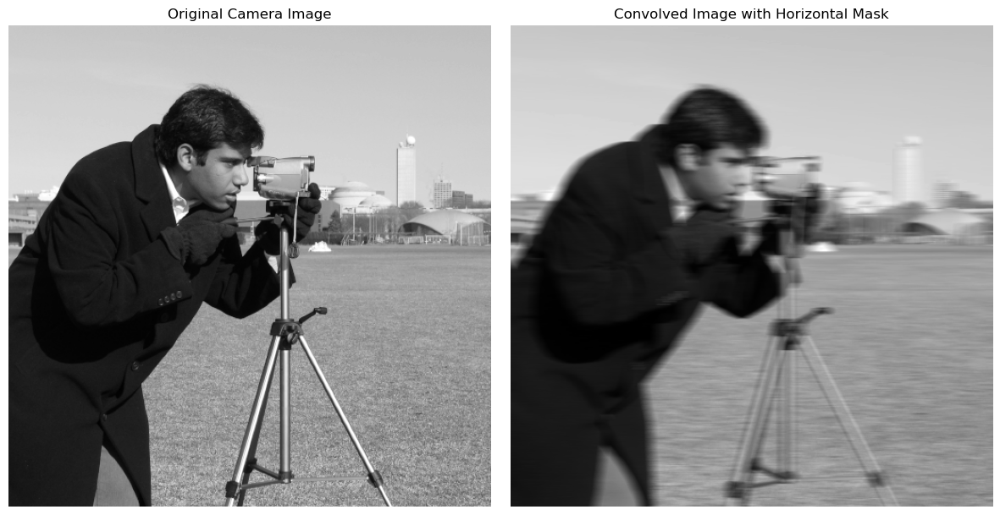

In [3]:

from scipy.ndimage import convolve

# Step 1: Load the 'camera' image from skimage.data
camera_image = data.camera()

# Step 2: Define the horizontal mask (1x15 with all values set to ones)
horizontal_mask = np.ones((1, 15))

# Step 3: Normalize the mask
horizontal_mask /= np.sum(horizontal_mask)

# Step 4: Convolve the image with the normalized horizontal mask
convolved_image = convolve(camera_image, horizontal_mask)

# Step 5: Visualize the original and convolved images
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(camera_image, cmap='gray')
plt.title('Original Camera Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(convolved_image, cmap='gray')
plt.title('Convolved Image with Horizontal Mask')
plt.axis('off')

plt.tight_layout()
plt.show()



*   Convolve the image with a vertical mask:  (15 x 1) with all values set to ones

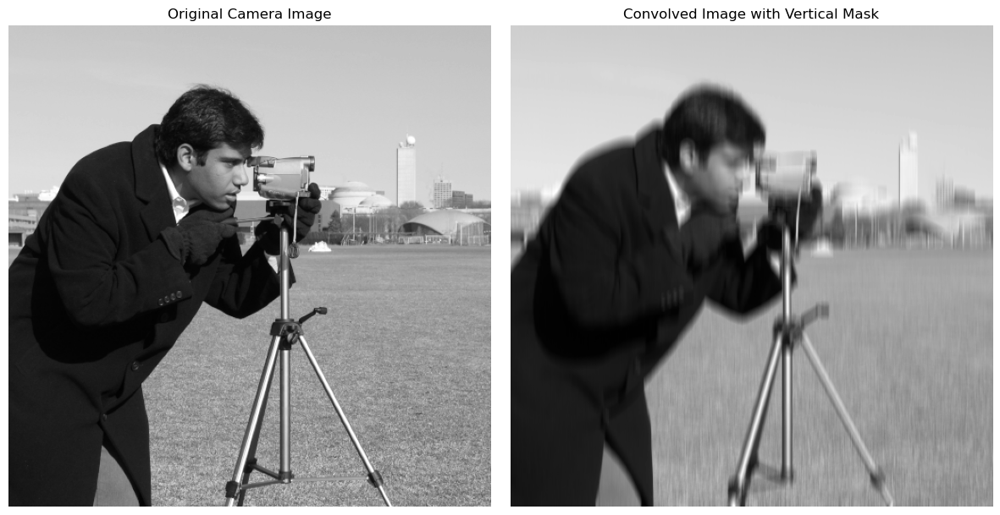

In [4]:
vertical_mask = np.ones((15, 1))

# Step 3: Normalize the mask
vertical_mask /= np.sum(vertical_mask)

# Step 4: Convolve the image with the normalized vertical mask
convolved_image = convolve(camera_image, vertical_mask)

# Step 5: Visualize the original and convolved images
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(camera_image, cmap='gray')
plt.title('Original Camera Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(convolved_image, cmap='gray')
plt.title('Convolved Image with Vertical Mask')
plt.axis('off')

plt.tight_layout()
plt.show()


*   Convolve the image with a 2D mask:  (15 x 15) with all values set to ones

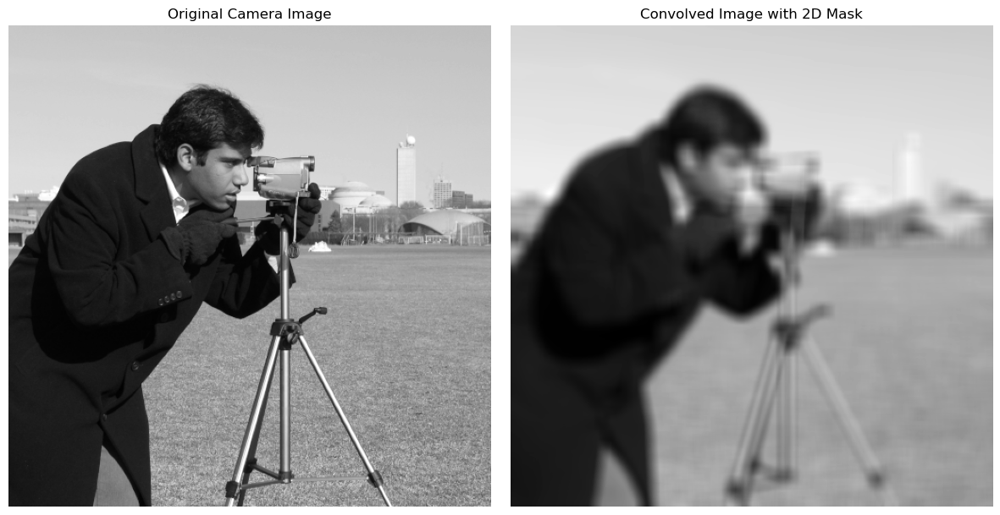

In [5]:
mask_size = 15
mask_2d = np.ones((mask_size, mask_size))

# Step 3: Normalize the mask
mask_2d /= np.sum(mask_2d)

# Step 4: Convolve the image with the normalized 2D mask
convolved_image = convolve(camera_image, mask_2d)

# Step 5: Visualize the original and convolved images
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(camera_image, cmap='gray')
plt.title('Original Camera Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(convolved_image, cmap='gray')
plt.title('Convolved Image with 2D Mask')
plt.axis('off')

plt.tight_layout()
plt.show()


*   Visualize the original image, horizontal convolution, vertical convolution, 2D convolution using matplotlib subplot.

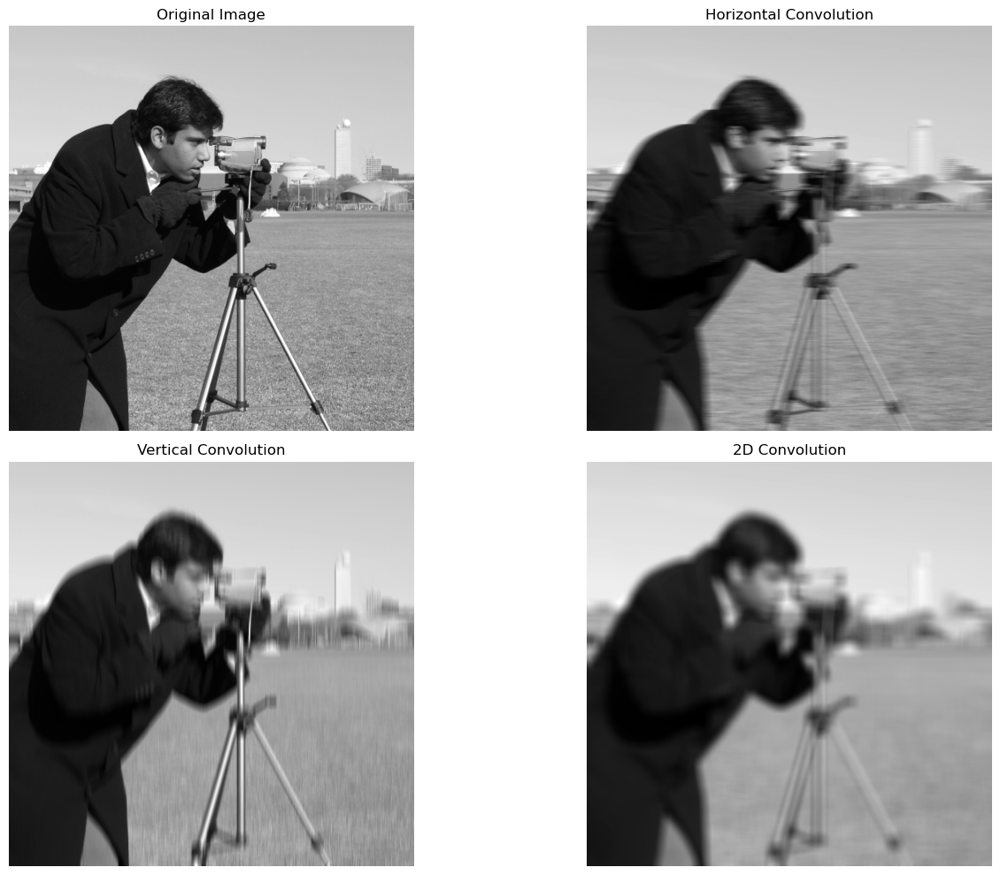

In [6]:
horizontal_mask = np.ones((1, 15))
vertical_mask = np.ones((15, 1))
mask_2d = np.ones((15, 15))

# Step 3: Normalize masks
horizontal_mask /= np.sum(horizontal_mask)
vertical_mask /= np.sum(vertical_mask)
mask_2d /= np.sum(mask_2d)

# Step 4: Perform convolutions
convolved_horizontal = convolve(camera_image, horizontal_mask)
convolved_vertical = convolve(camera_image, vertical_mask)
convolved_2d = convolve(camera_image, mask_2d)

# Step 5: Visualize results
plt.figure(figsize=(15, 10))

# Original image
plt.subplot(2, 2, 1)
plt.imshow(camera_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Horizontal convolution
plt.subplot(2, 2, 2)
plt.imshow(convolved_horizontal, cmap='gray')
plt.title('Horizontal Convolution')
plt.axis('off')

# Vertical convolution
plt.subplot(2, 2, 3)
plt.imshow(convolved_vertical, cmap='gray')
plt.title('Vertical Convolution')
plt.axis('off')

# 2D convolution
plt.subplot(2, 2, 4)
plt.imshow(convolved_2d, cmap='gray')
plt.title('2D Convolution')
plt.axis('off')

plt.tight_layout()
plt.show()


*   Apply 2 stage convolution: Horizontal mask (1 x 15) with all values set to 1 followed by vertical mask (15 x 1) with all values set to 1
*   Visualize the original image, 2D convolved image, 2 stage convolved image using matplotlib subplot.


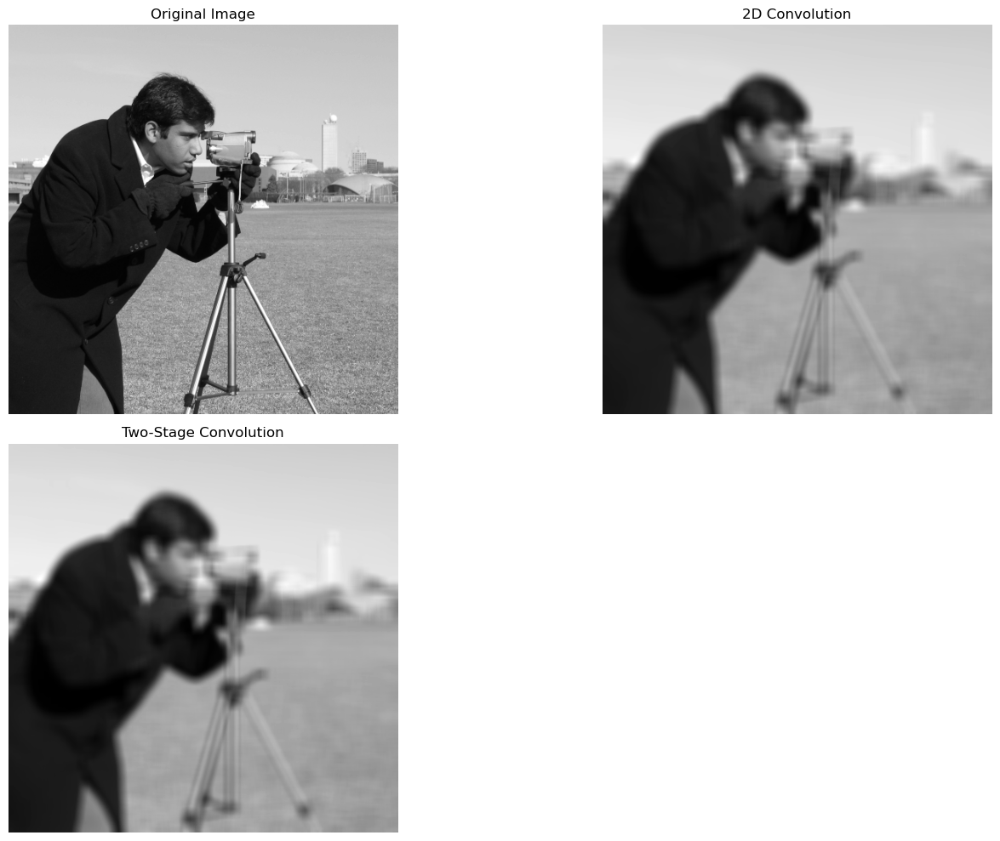

In [7]:
convolved_horizontal = convolve(camera_image, horizontal_mask)
two_stage_convolved = convolve(convolved_horizontal, vertical_mask)

# Step 5: Visualize results
plt.figure(figsize=(15, 10))

# Original image
plt.subplot(2, 2, 1)
plt.imshow(camera_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# 2D convolved image (single convolution with (15 x 15) mask of ones)
mask_2d = np.ones((15, 15)) / 225.0  # Normalized 15x15 mask
convolved_2d = convolve(camera_image, mask_2d)

plt.subplot(2, 2, 2)
plt.imshow(convolved_2d, cmap='gray')
plt.title('2D Convolution')
plt.axis('off')

# Two-stage convolved image (horizontal followed by vertical)
plt.subplot(2, 2, 3)
plt.imshow(two_stage_convolved, cmap='gray')
plt.title('Two-Stage Convolution')
plt.axis('off')

plt.tight_layout()
plt.show()


*   Is the result different from applying convolution with 2D mask (15 x 15) with all values set to 1?

**Solution**

*(Double-click or enter to edit)*

...

# Image Blurring

*   Why is blurring important?


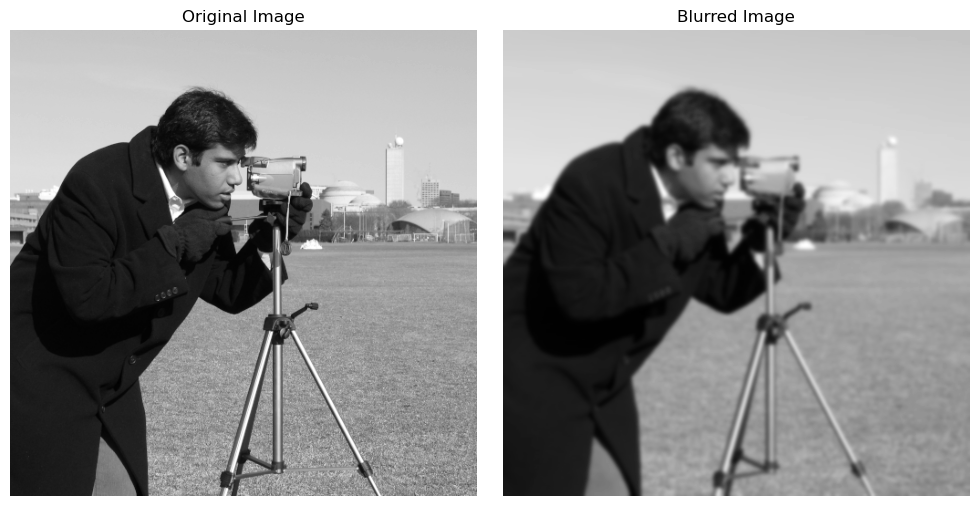

In [9]:
from scipy.ndimage import gaussian_filter
blurred_image = gaussian_filter(camera_image, sigma=2)

# Step 3: Visualize the original and blurred images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(camera_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(blurred_image, cmap='gray')
plt.title('Blurred Image')
plt.axis('off')

plt.tight_layout()
plt.show()

### Exercise: Gaussian Filter
*   Read 'astronaut' image from the data module
*   Convert the image to grayscale.
*   Apply a gaussian filter with sigma=1
*   Hint: *gaussian function is available in skimage.filters module*

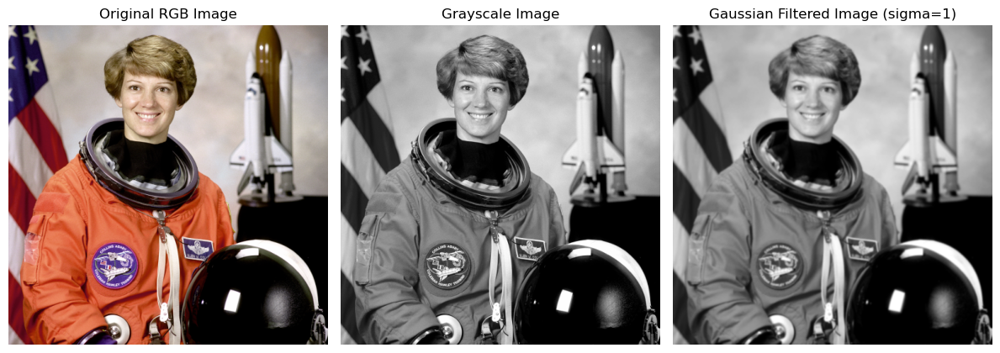

In [10]:
astronaut_image = data.astronaut()

# Step 2: Convert the image to grayscale
gray_image = color.rgb2gray(astronaut_image)

# Step 3: Apply Gaussian filter with sigma=1
gaussian_filtered = filters.gaussian(gray_image, sigma=1)

# Step 4: Visualize the images
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(astronaut_image)
plt.title('Original RGB Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(gaussian_filtered, cmap='gray')
plt.title('Gaussian Filtered Image (sigma=1)')
plt.axis('off')

plt.tight_layout()
plt.show()


*   Apply a gaussian filter with sigma=0. What is the result of this operation?

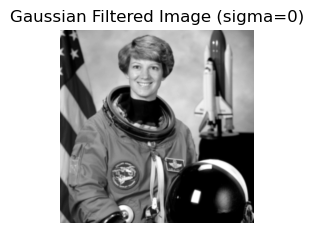

In [15]:
plt.subplot(1, 3, 3)
plt.imshow(gaussian_filtered, cmap='gray')
plt.title('Gaussian Filtered Image (sigma=0)')
plt.axis('off')

plt.tight_layout()
plt.show()


*   Vary the value of sigma in the gaussian filter. Apply sigma=0.25, 0.5, 1, 1.5, 2, 5
*   Visualize the different results using matplotlib subplot.

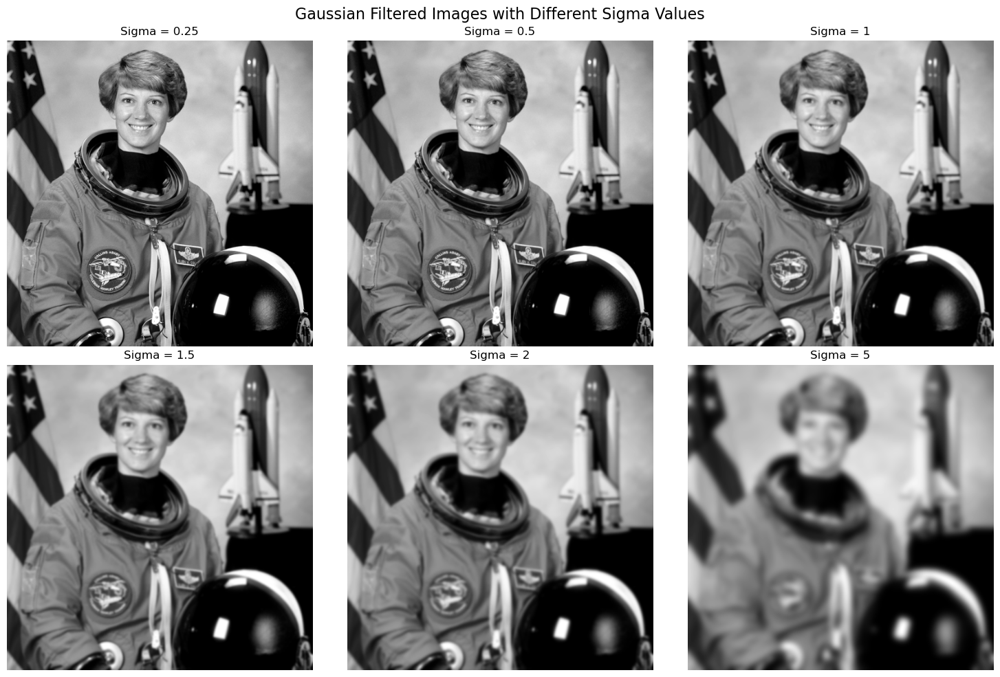

In [16]:
# # Step 3: Define sigma values to test
sigma_values = [0.25, 0.5, 1, 1.5, 2, 5]

# Step 4: Apply Gaussian filter with different sigma values and visualize the results
plt.figure(figsize=(15, 10))

for i, sigma in enumerate(sigma_values):
    # Apply Gaussian filter
    gaussian_filtered = filters.gaussian(gray_image, sigma=sigma)
    
    # Plotting
    plt.subplot(2, 3, i + 1)
    plt.imshow(gaussian_filtered, cmap='gray')
    plt.title(f'Sigma = {sigma}')
    plt.axis('off')

plt.suptitle('Gaussian Filtered Images with Different Sigma Values', fontsize=16)
plt.tight_layout()
plt.show()



*    What happens when a larger sigma value is used and what happens when a smaller sigma value is used in the gaussian filter?
*    What determines the optimal sigma value?



the image gets blurrier and blurrier

### Exercise: Median Filter
*   Convert the 'astronauts' image to grayscale
*   Apply median filter with a disk structuring element of radius 1, 5, 10
*   Visualize the original image and the filtered image matplotlib subplot.

C:\Users\emin.sen\AppData\Local\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py:3553: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)


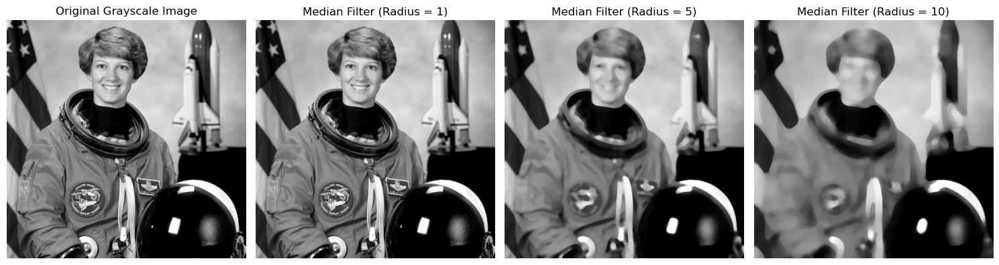

In [23]:

import matplotlib.pyplot as plt
from skimage import data, color, filters, morphology
from skimage.filters.rank import median
gray_image = color.rgb2gray(astronaut_image)

radii = [1, 5, 10]

# Step 4: Apply median filter with disk structuring elements and visualize the results
plt.figure(figsize=(15, 10))

# Plot original grayscale image
plt.subplot(2, len(radii) + 1, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')

# Plot images filtered with different radii
for i, radius in enumerate(radii):
    # Apply median filter with disk structuring element
    median_filtered = median(gray_image, morphology.disk(radius))
    
    # Plotting
    plt.subplot(2, len(radii) + 1, i + 2)
    plt.imshow(median_filtered, cmap='gray')
    plt.title(f'Median Filter (Radius = {radius})')
    plt.axis('off')

plt.tight_layout()
plt.show()

*   Change the structuring element to square, rectangle and diamond
*   Visualize the original image and the filtered image using matplotlib

TypeError: median() got an unexpected keyword argument 'selem'

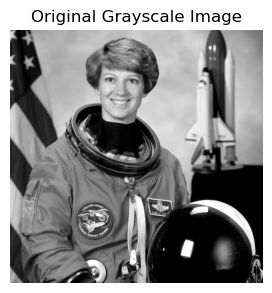

In [28]:
from skimage.morphology import square, rectangle, diamond
from skimage.filters.rank import median


structuring_elements = [
    square(5),            # Square with side length 5
    rectangle(5, 10),     # Rectangle with dimensions 5x10
    diamond(5)            # Diamond with side length 5
]

# Step 4: Apply median filter with different structuring elements and visualize the results
plt.figure(figsize=(15, 5))

# Plot original grayscale image
plt.subplot(1, len(structuring_elements) + 1, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')

# Plot images filtered with different structuring elements
for i, selem in enumerate(structuring_elements):
    # Apply median filter with structuring element
    median_filtered = median(gray_image, selem=np.ones(selem.shape), footprint=selem)
    
    # Plotting
    plt.subplot(1, len(structuring_elements) + 1, i + 2)
    plt.imshow(median_filtered, cmap='gray')
    plt.title(f'Median Filter ({selem.__class__.__name__})')
    plt.axis('off')

plt.tight_layout()
plt.show()

*   What is the effect of the structuring element on the median filter?


**Solution**

*(Double-click or enter to edit)*

...

*   What is the difference between gaussian filter, mean filter and median filter?
*   Provide an example where each one would be used.


**Solution**

Gaussian Filter: Smooths images while preserving edges, suitable for noise reduction and preprocessing tasks.
Mean Filter: Computes the average intensity in a neighborhood, effective for general smoothing and noise reduction.
Median Filter: Replaces each pixel with the median value in a neighborhood, useful for preserving edges while removing salt-and-pepper noise.
...

### Exercise: Effect of noise

It is easy to add noise to an image using the random_noise function available in skimage.util

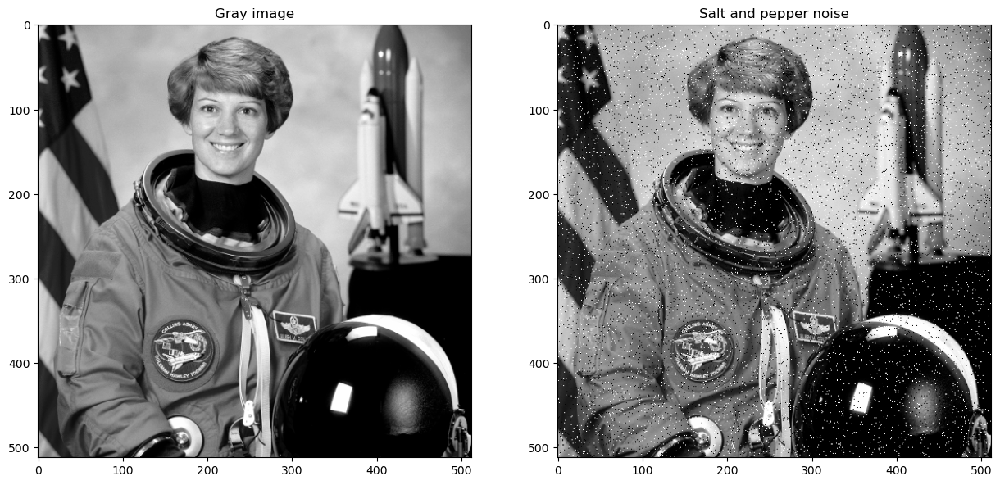

In [29]:
from skimage.util import random_noise
image = data.astronaut()
image = color.rgb2gray(image)

img_noise = random_noise(image, mode='s&p')  # salt and pepper noise is added

fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(15, 7))

ax[0].imshow(image, cmap='gray')
ax[0].set_title('Gray image')
ax[1].imshow(img_noise, cmap='gray')
ax[1].set_title('Salt and pepper noise')

plt.show()

*   Create noisy images with **gaussian** noise and **salt and pepper** noise.
*   Apply mean filter, median filter and gaussian filter in each of the noisy images.
*   Visualize the images and observe the difference in each filter with respect to the noise.

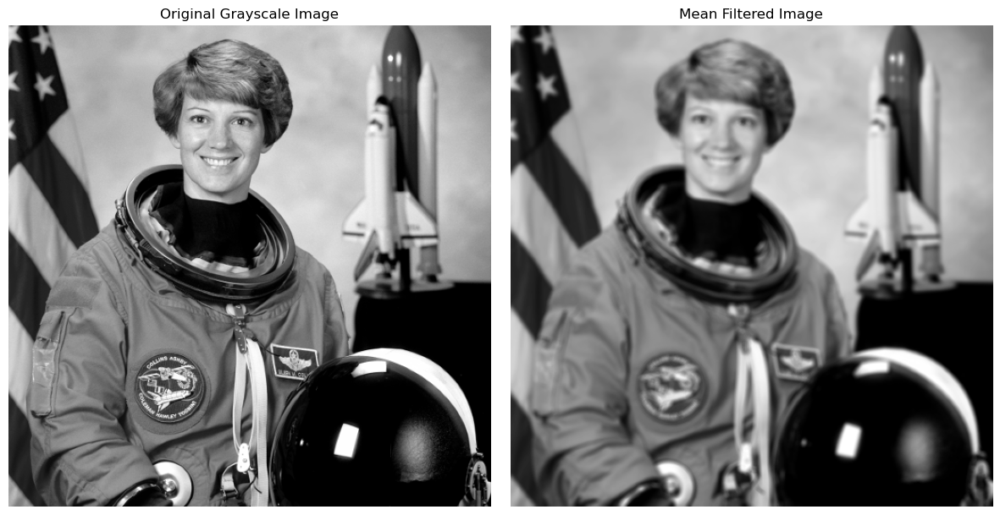

In [31]:
import matplotlib.pyplot as plt
from skimage import data, color, filters
from skimage.filters.rank import mean
from skimage.morphology import disk

# Load the 'astronaut' image and convert to grayscale
image = data.astronaut()
image_gray = color.rgb2gray(image)

# Add salt-and-pepper noise and Gaussian noise to the grayscale image (example)
# Assume img_sp_noise and img_gaussian_noise are generated using random_noise function

# Apply mean filter with a disk-shaped structuring element (radius of 3 pixels)
filtered_sp_mean = mean(image_gray, disk(3))  # Adjust disk size as needed

# Visualize the images
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(12, 6))

axes[0].imshow(image_gray, cmap='gray')
axes[0].set_title('Original Grayscale Image')
axes[0].axis('off')

axes[1].imshow(filtered_sp_mean, cmap='gray')
axes[1].set_title('Mean Filtered Image')
axes[1].axis('off')

plt.tight_layout()
plt.show()


*   Which filter works better for gaussian noise and which filter works better for salt and pepper noise? Explain your choice of the filter for that particular type of noise.


**Solution**

*(Double-click or enter to edit)*

...

# Image Sharpening

A sharpening filter can be broken down into two steps: It takes a smoothed image, subtracts it from the original image to obtain the "details" of the image, and adds the "details" to the original image.

enhanced image = original + amount * (original - blurred)

### Exercise:
*   Read 'moon' image from the data module
*   Perform smoothing using a gaussian filter of sigma 1
*   Subtract the smoothened image from the original image.
*   Enhance the image with amount=1
*   Visualize each of the steps using matplotlib

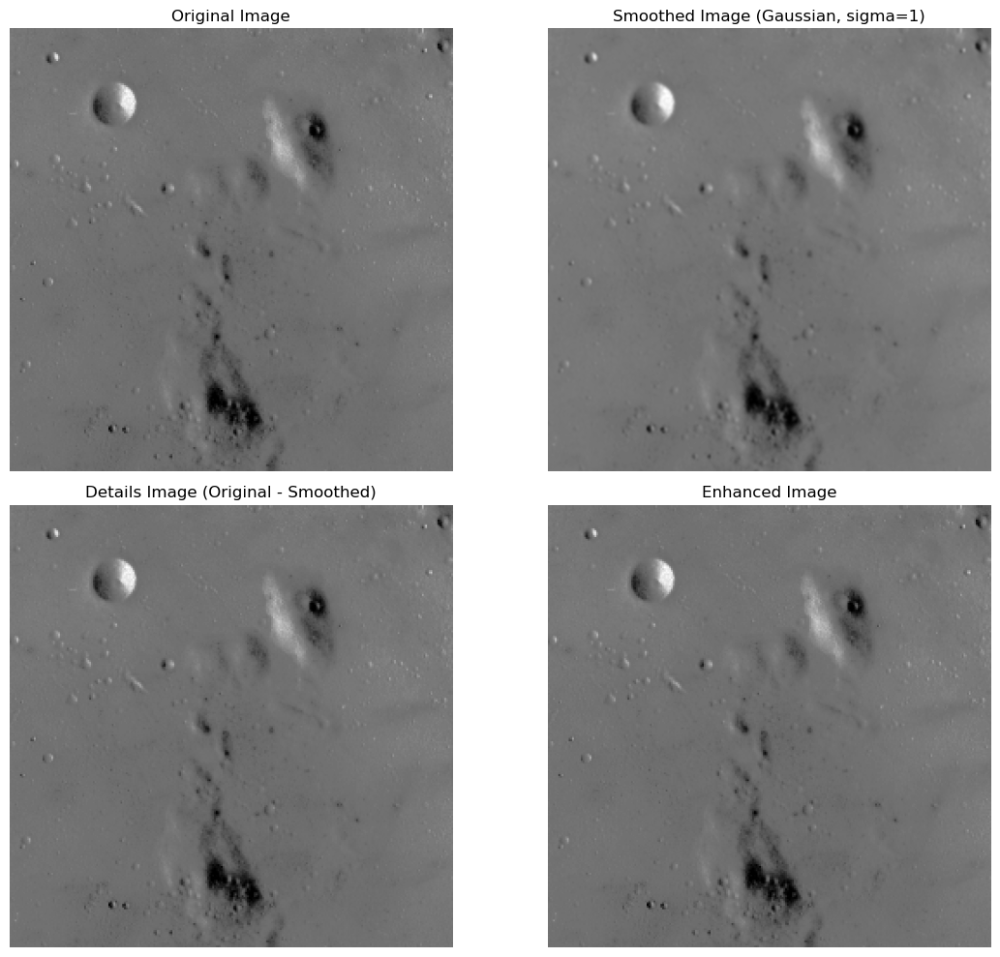

In [32]:
import matplotlib.pyplot as plt
from skimage import data, color, filters

# Step 1: Load the 'moon' image from the data module
moon_image = data.moon()

# Step 2: Perform smoothing using a Gaussian filter with sigma=1
smoothed_image = filters.gaussian(moon_image, sigma=1)

# Step 3: Subtract the smoothed image from the original image to get the "details"
details_image = moon_image - smoothed_image

# Step 4: Enhance the image by adding the details back to the original image with amount=1
amount = 1
enhanced_image = moon_image + amount * details_image

# Step 5: Visualize each step using matplotlib
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

# Original image
axes[0, 0].imshow(moon_image, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

# Smoothed image
axes[0, 1].imshow(smoothed_image, cmap='gray')
axes[0, 1].set_title('Smoothed Image (Gaussian, sigma=1)')
axes[0, 1].axis('off')

# Details image
axes[1, 0].imshow(details_image, cmap='gray')
axes[1, 0].set_title('Details Image (Original - Smoothed)')
axes[1, 0].axis('off')

# Enhanced image
axes[1, 1].imshow(enhanced_image, cmap='gray')
axes[1, 1].set_title('Enhanced Image')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()



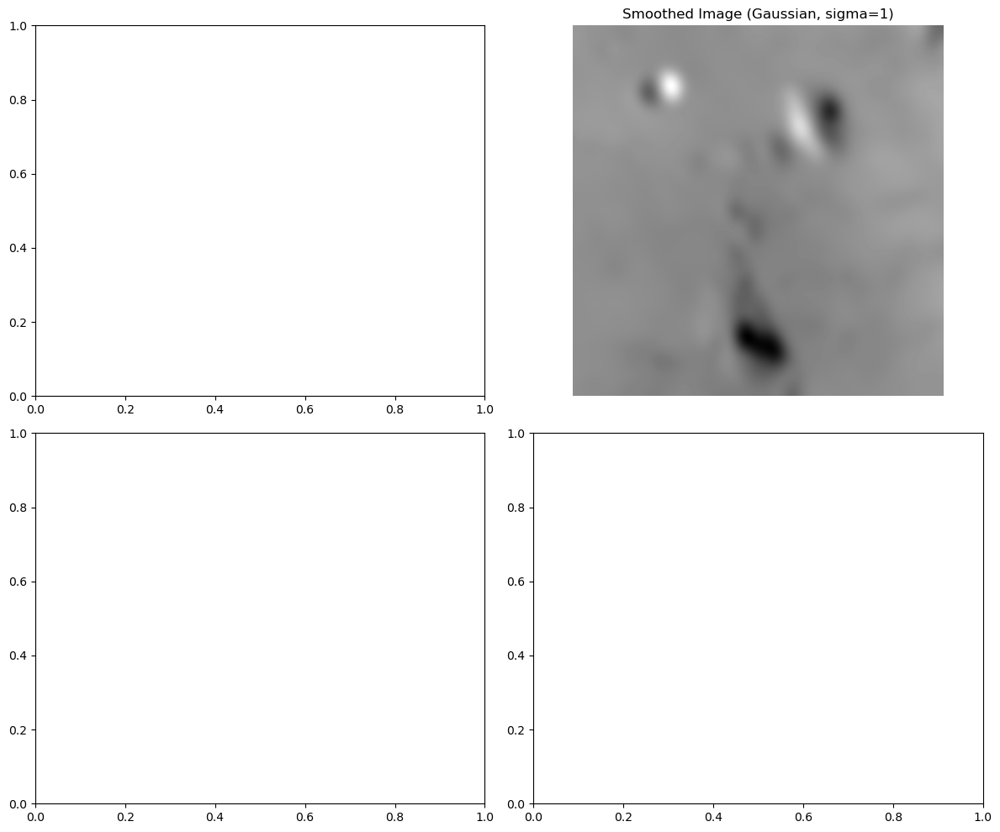

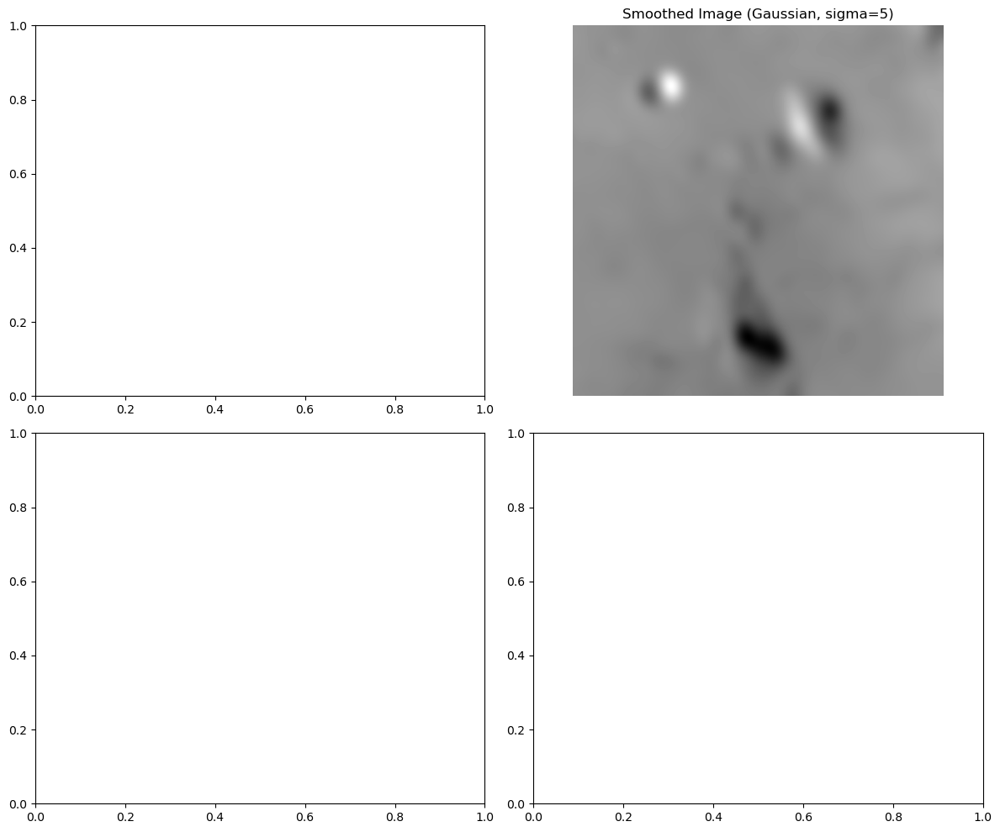

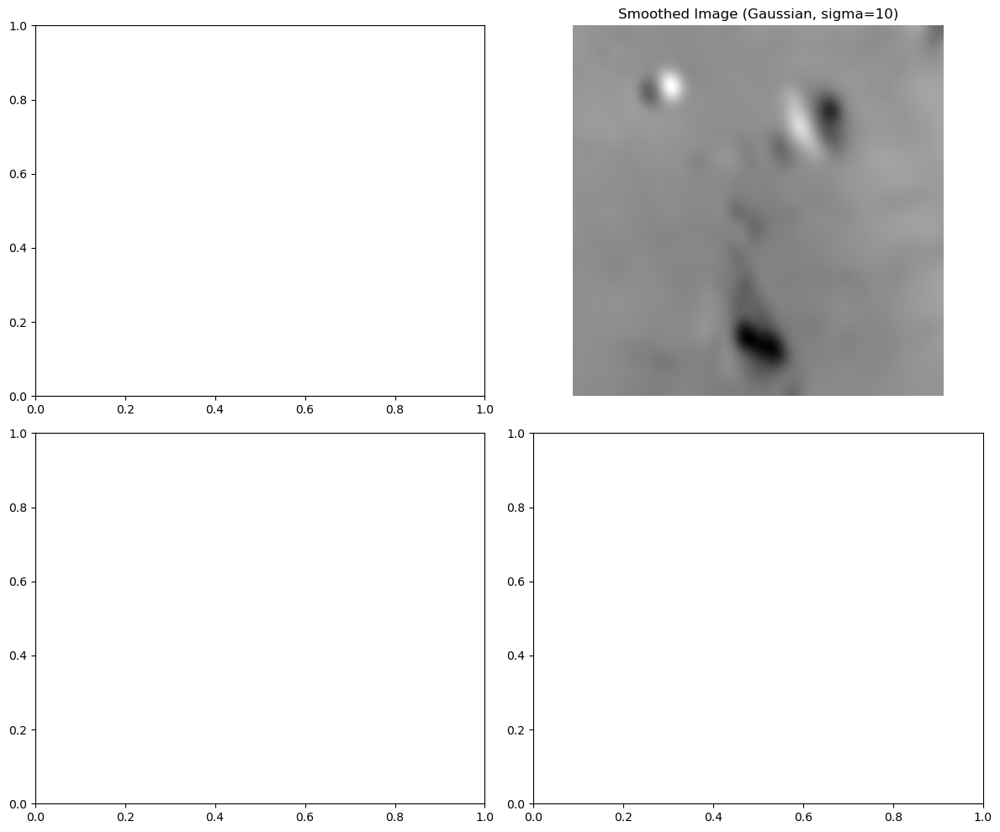

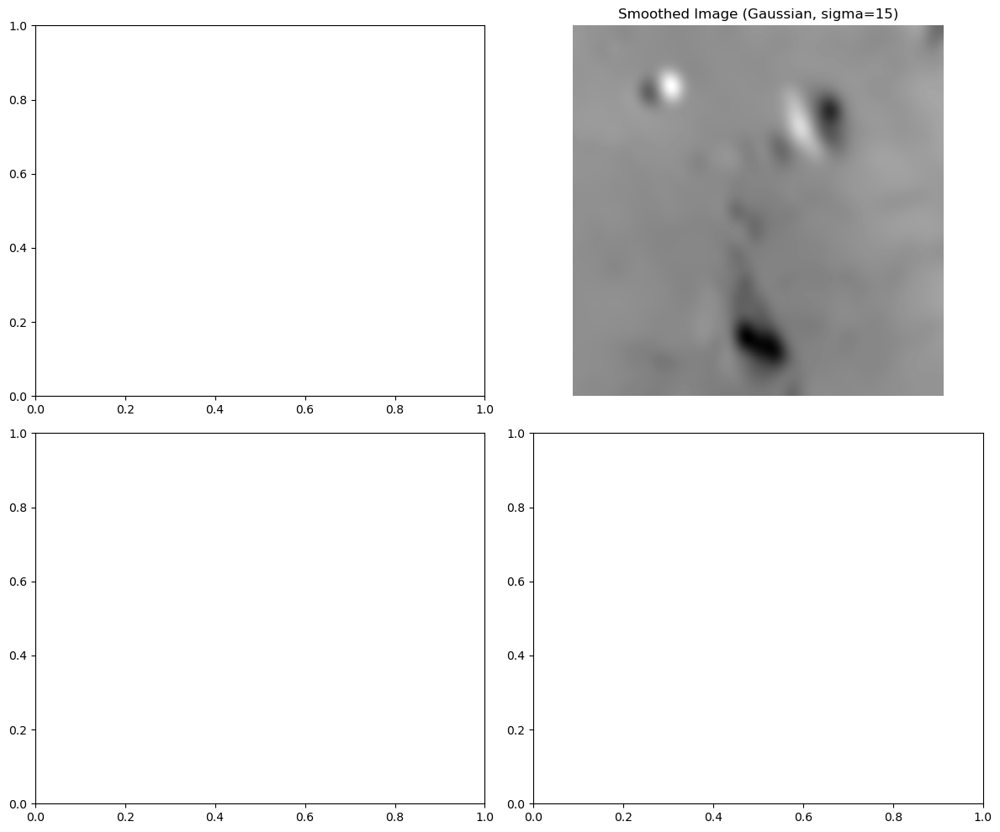

In [40]:


fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))



# Smoothed image
axes[0, 1].imshow(smoothed_image, cmap='gray')
axes[0, 1].set_title('Smoothed Image (Gaussian, sigma=1)')
axes[0, 1].axis('off')

plt.tight_layout()
plt.show()
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

# Smoothed image
axes[0, 1].imshow(smoothed_image, cmap='gray')
axes[0, 1].set_title('Smoothed Image (Gaussian, sigma=5)')
axes[0, 1].axis('off')

plt.tight_layout()
plt.show()
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

# Smoothed image
axes[0, 1].imshow(smoothed_image, cmap='gray')
axes[0, 1].set_title('Smoothed Image (Gaussian, sigma=10)')
axes[0, 1].axis('off')

plt.tight_layout()
plt.show()
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

# Smoothed image
axes[0, 1].imshow(smoothed_image, cmap='gray')
axes[0, 1].set_title('Smoothed Image (Gaussian, sigma=15)')
axes[0, 1].axis('off')

plt.tight_layout()
plt.show()


*   Keeping amount=1, change the value of sigma=5,10 and repeat the enhancements
*   Using the best sigma value, vary the amount value=0.5,2,5,10
*   Visualize the sharpened images using matplotlib

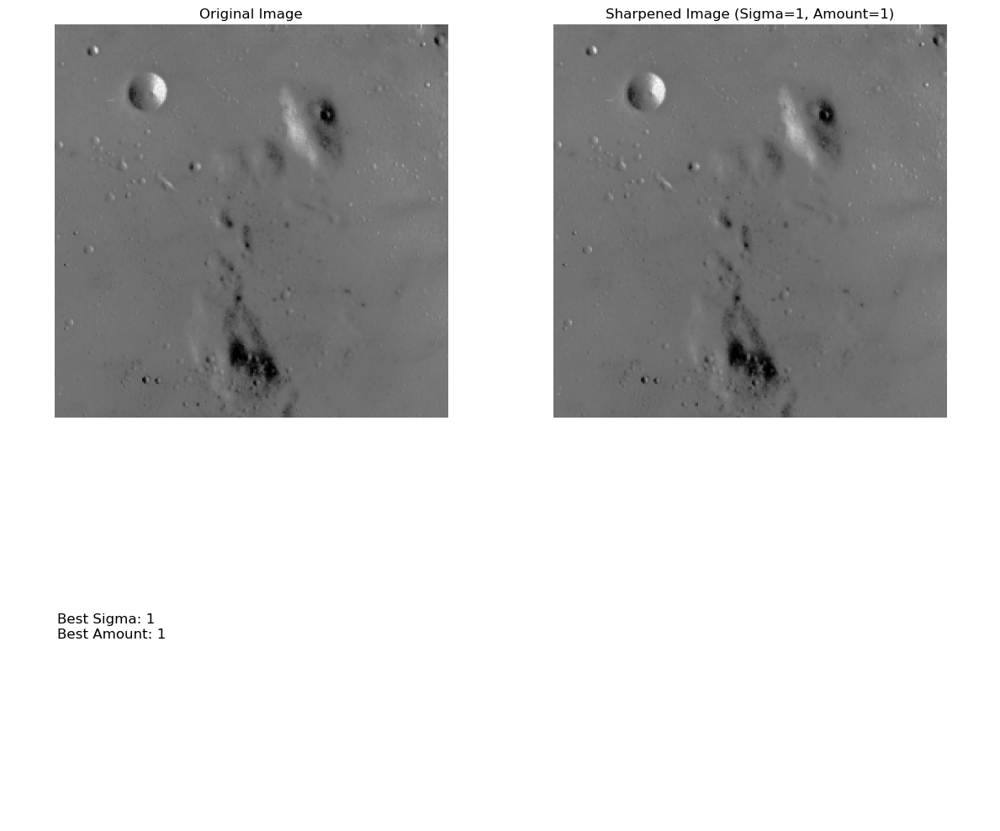

In [34]:
sigma_values = [1, 5, 10]
amount_values = [0.5, 2, 5, 10]

# Initialize variables to store the best result
best_sigma = None
best_sharpened_image = None
best_sharpened_score = float('-inf')  # initialize with negative infinity

# Iterate over each sigma value
for sigma in sigma_values:
    # Step 2: Perform smoothing using a Gaussian filter with the current sigma value
    smoothed_image = filters.gaussian(moon_image, sigma=sigma)

    # Step 3: Subtract the smoothed image from the original image to get the "details"
    details_image = moon_image - smoothed_image

    # Step 4: Enhance the image by adding the details back to the original image with amount=1
    amount = 1
    enhanced_image = moon_image + amount * details_image

    # Step 5: Repeat enhancements with different amount values using the current sigma
    for amount_value in amount_values:
        enhanced_image_current = moon_image + amount_value * details_image

        # Evaluate the result (you can use any metric here)
        # For simplicity, let's calculate the sum of pixel values
        sharpened_score = enhanced_image_current.sum()

        # Update the best result based on the score (maximize the score)
        if sharpened_score > best_sharpened_score:
            best_sharpened_score = sharpened_score
            best_sigma = sigma
            best_sharpened_image = enhanced_image_current

# Step 6: Visualize the best sharpened image using matplotlib
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

# Original image
axes[0, 0].imshow(moon_image, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

# Best sharpened image
axes[0, 1].imshow(best_sharpened_image, cmap='gray')
axes[0, 1].set_title(f'Sharpened Image (Sigma={best_sigma}, Amount={amount})')
axes[0, 1].axis('off')

# Show sigma and amount values used
axes[1, 0].text(0.1, 0.5, f"Best Sigma: {best_sigma}\nBest Amount: {amount}", fontsize=12, va='center')
axes[1, 0].axis('off')

# Space filler for better layout
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()


# Edge Detection

### Exercise:
*   Read 'camera' image from the data module
*   Perform sobel, prewitt and roberts edge detection on the image
*   Visualize the original image, the edges and the edges superimposed on the original image

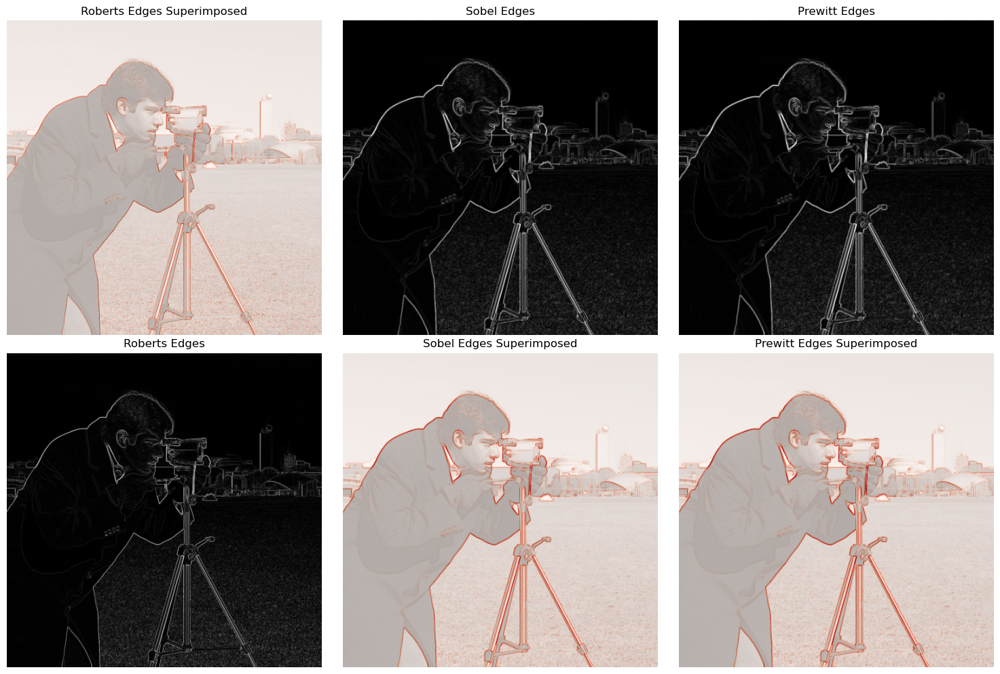

In [42]:
import matplotlib.pyplot as plt
from skimage import data, color, filters

# Step 1: Load the 'camera' image from the data module
camera_image = data.camera()

# Step 2: Apply edge detection using different methods
# Sobel edge detection
edges_sobel = filters.sobel(camera_image)

# Prewitt edge detection
edges_prewitt = filters.prewitt(camera_image)

# Roberts edge detection
edges_roberts = filters.roberts(camera_image)

# Step 3: Visualize the results using matplotlib
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

# Original image
axes[0, 0].imshow(camera_image, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

# Sobel edges
axes[0, 1].imshow(edges_sobel, cmap='gray')
axes[0, 1].set_title('Sobel Edges')
axes[0, 1].axis('off')

# Prewitt edges
axes[0, 2].imshow(edges_prewitt, cmap='gray')
axes[0, 2].set_title('Prewitt Edges')
axes[0, 2].axis('off')

# Superimpose Sobel edges on original image
axes[1, 1].imshow(camera_image, cmap='gray')
axes[1, 1].imshow(edges_sobel, cmap='Reds', alpha=0.7)
axes[1, 1].set_title('Sobel Edges Superimposed')
axes[1, 1].axis('off')

# Superimpose Prewitt edges on original image
axes[1, 2].imshow(camera_image, cmap='gray')
axes[1, 2].imshow(edges_prewitt, cmap='Reds', alpha=0.7)
axes[1, 2].set_title('Prewitt Edges Superimposed')
axes[1, 2].axis('off')

# Roberts edges
axes[1, 0].imshow(edges_roberts, cmap='gray')
axes[1, 0].set_title('Roberts Edges')
axes[1, 0].axis('off')

# Superimpose Roberts edges on original image
axes[0, 0].imshow(camera_image, cmap='gray')
axes[0, 0].imshow(edges_roberts, cmap='Reds', alpha=0.7)
axes[0, 0].set_title('Roberts Edges Superimposed')
axes[0, 0].axis('off')

plt.tight_layout()
plt.show()




*   What is the difference between each of the edge detectors?
*   What does you think is the limitation of each of the detector?



**Solution**

*(Double-click or enter to edit)*

...

### Exercise: Canny edge detector
*   Read 'camera' image from the data module
*   Apply canny operator with default parameters
*   Apply canny by varying sigma=1, 3, 5, 10
*   Visualize the original image along with the edges detected using matplotlib.

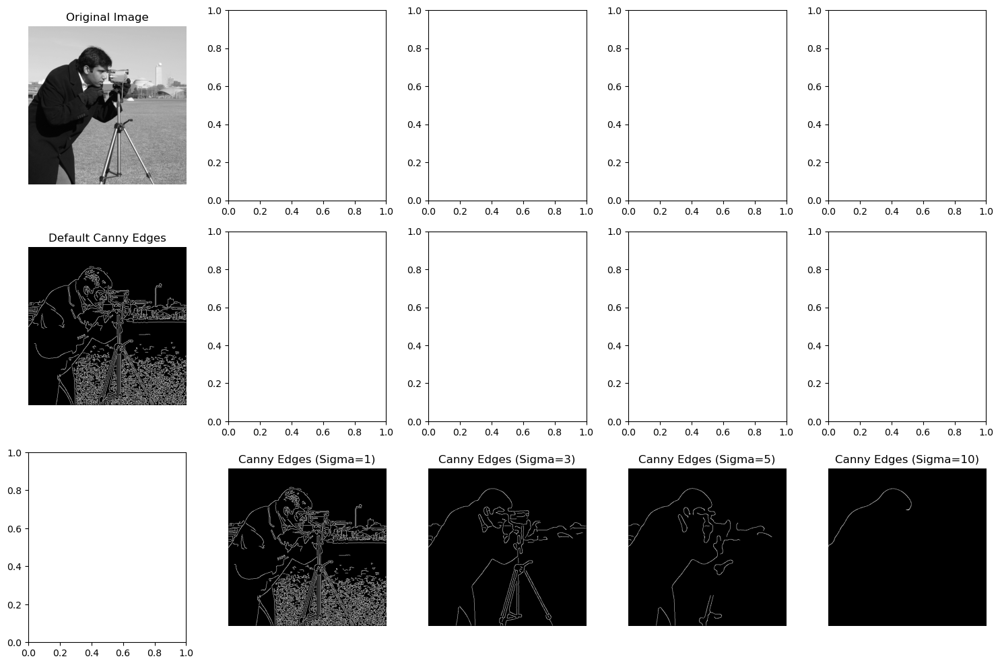

In [43]:
import matplotlib.pyplot as plt
from skimage import data, feature

# Step 1: Load the 'camera' image from the data module
camera_image = data.camera()

# Step 2: Apply Canny edge detection with default parameters
edges_default = feature.canny(camera_image)

# Step 3: Apply Canny edge detection with different sigma values
sigmas = [1, 3, 5, 10]
edges_sigma = {}

for sigma in sigmas:
    edges_sigma[sigma] = feature.canny(camera_image, sigma=sigma)

# Step 4: Visualize the results using matplotlib
fig, axes = plt.subplots(nrows=3, ncols=len(sigmas)+1, figsize=(15, 10))

# Original image
axes[0, 0].imshow(camera_image, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

# Default Canny edges
axes[1, 0].imshow(edges_default, cmap='gray')
axes[1, 0].set_title('Default Canny Edges')
axes[1, 0].axis('off')

# Loop over sigma values
for i, sigma in enumerate(sigmas):
    axes[2, i+1].imshow(edges_sigma[sigma], cmap='gray')
    axes[2, i+1].set_title(f'Canny Edges (Sigma={sigma})')
    axes[2, i+1].axis('off')

# Adjust layout for better display
plt.tight_layout()
plt.show()



*   What is the effect of varying the sigma values on the edges?
*   What do the high threshold and low threshold parameters denote?


**Solution**

*(Double-click or enter to edit)*

...

*   What is the algorithm behind the Canny operator?


**Solution**

*(Double-click or enter to edit)*

...